In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
from sklearn.preprocessing import Imputer
from sklearn import preprocessing
from sklearn.cross_validation import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
import pandas_profiling 
from xgboost.sklearn import XGBRegressor
from sklearn.neural_network import MLPRegressor
%matplotlib inline 

In [4]:
train = pd.read_csv('D:/kaggle/Houseprediction/train.csv')
test  = pd.read_csv('D:/kaggle/Houseprediction/test.csv')   

In [5]:
#I have written a function that takes in data and take care of missing values (described below) . The purpose of adding a data type column is as follows
#We will combined the train and test data, and after using the above mentioned function we will segregate the data again by filtering the data with datatype
#column
train['DataType'] = 1500
test['DataType'] = 1000

In [6]:
combined = pd.concat([train,test],axis=0)

In [5]:
combined['DataType'].value_counts()

1500    1460
1000    1459
Name: DataType, dtype: int64

In [527]:
#generating pandas profiline and Saving to file 
profile = pandas_profiling.ProfileReport(combined)
profile.to_file(outputfile="D:/Hands_on_ML_Assignments/Assignment/pandas.html")

In [7]:
#imputing missing values for numerical by median and categorical by most frequent
def impute_cat_num(train):
    cat = []
    num = []
    #m = train.columns[train.isnull().any()] #will give columns names with missing values
    for i in train.columns:
        if train[i].dtype == object:
            cat.append(i)
        else:
            num.append(i)  
    #imputing numerical with mean
    imputer = Imputer(strategy="median")
    housing_num = train[num]
    imputer.fit(housing_num)
    X = imputer.transform(housing_num)
    housing_tr = pd.DataFrame(X, columns=housing_num.columns,
                              index = list(housing_num.index.values))
    # Check for missing values if any
    print ("Missing value in numerical variables: ",np.count_nonzero(housing_tr.isnull().values))
    
    #We have to use label encoder as sklearn cant work with strings
    # Before that we need to replace missing value with a very large value as label encoder cant work with missing values
    cat2 = train[cat].fillna(20000000000000000000)
    le = preprocessing.LabelEncoder()
    tr = cat2.astype(str).apply(le.fit_transform)
    
    #Replacing missing value filled with 20000000 as 'NaN'
    k = dict(zip(le.classes_, le.transform(le.classes_)))
    tr = tr.replace(k['20000000000000000000'],'NaN')
    
    print ("Labelled classes are: ", k)
    #Lets substitute categorical by most frequent 
    imputer = Imputer(strategy="most_frequent")
    housing_cat = tr
    imputer.fit(housing_cat)
    X = imputer.transform(housing_cat)
    housing_ctr = pd.DataFrame(X, columns=housing_cat.columns,
                              index = list(housing_cat.index.values))
    print ("Missing value in categorical variables: ",np.count_nonzero(housing_ctr.isnull().values))
    filled_data = pd.concat([housing_tr,housing_ctr],axis =1)
       
    return filled_data

In [8]:
combined1 = impute_cat_num(combined)

Missing value in numerical variables:  0
Labelled classes are:  {'NoSeWa': 2, 'AllPub': 1, '20000000000000000000': 0}
Missing value in categorical variables:  0


In [9]:
#splitting the combined file as per train and test original file
train_f = combined1[combined1['DataType'] == 1500]
test_f = combined1[combined1['DataType'] == 1000]

In [532]:
#There are many variable lets first do varaible selection using random forest
X_train = train_f.drop(['Id','DataType','SalePrice'],axis =1)
X_test = test_f.drop(['DataType','SalePrice'],axis =1)
y_train = train_f['SalePrice']

#Selecting most important features
param_grid = [
    # try 12 (3×4) combinations of hyperparameters
    {'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
    # then try 6 (2×3) combinations with bootstrap set as False
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
  ]
  
fr = RandomForestRegressor()
gh = GridSearchCV(fr, param_grid, cv=5,
                           scoring='neg_mean_squared_error')
gh.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=10, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid=[{'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]}, {'n_estimators': [3, 10], 'bootstrap': [False], 'max_features': [2, 3, 4]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='neg_mean_squared_error', verbose=0)

In [533]:
#Lets select the most important features
feature_importances = gh.best_estimator_.feature_importances_
indices = np.argsort(feature_importances)[::-1]
feature_names = [X_train.columns[i] for i in indices]
#sorted(zip(feature_importances, feature_names), reverse=True)
feature_names

['BsmtQual',
 'GarageArea',
 'GrLivArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'OverallQual',
 'Fireplaces',
 'YearBuilt',
 'GarageCars',
 '2ndFlrSF',
 'LotArea',
 'BsmtFinSF1',
 'YearRemodAdd',
 'TotRmsAbvGrd',
 'SaleCondition',
 'MasVnrArea',
 'MSSubClass',
 'LotFrontage',
 'GarageYrBlt',
 'GarageFinish',
 'BedroomAbvGr',
 'OpenPorchSF',
 'WoodDeckSF',
 'Neighborhood',
 'FullBath',
 'Exterior1st',
 'BsmtUnfSF',
 'MoSold',
 'GarageType',
 'BsmtExposure',
 'OverallCond',
 'KitchenQual',
 'RoofStyle',
 'BsmtFinType1',
 'ScreenPorch',
 'BsmtFullBath',
 'RoofMatl',
 'HouseStyle',
 'Exterior2nd',
 'MSZoning',
 'LandContour',
 'ExterQual',
 'YrSold',
 'FireplaceQu',
 'HalfBath',
 'Foundation',
 'MasVnrType',
 'PoolArea',
 'BsmtCond',
 'Condition1',
 'EnclosedPorch',
 'Functional',
 'LotConfig',
 'HeatingQC',
 'SaleType',
 'LowQualFinSF',
 'KitchenAbvGr',
 'ExterCond',
 'BldgType',
 'BsmtFinSF2',
 'LotShape',
 'Electrical',
 'BsmtFinType2',
 'Condition2',
 'GarageQual',
 'Fence',
 '3SsnPorch',
 'Ga

In [13]:
#lets select the top 15 variables
features = ['BsmtQual',
 'GarageArea',
 'GrLivArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'OverallQual',
 'Fireplaces',
 'YearBuilt',
 'GarageCars',
 '2ndFlrSF',
 'LotArea',
 'BsmtFinSF1',
 'YearRemodAdd',
 'TotRmsAbvGrd',
 'SaleCondition']

In [21]:
f_test = features + ['Id']
final_train= X_train[features]
final_test= X_test[f_test]
y_train = pd.DataFrame(y_train, columns = ['SalePrice'])

In [22]:
#Lets combined target and predictors of training set so that we can do EDA on the same
EDA_dataset = pd.concat([final_train,y_train],axis =1)
EDA_dataset.describe()

,BsmtQual,GarageArea,GrLivArea,TotalBsmtSF,1stFlrSF,OverallQual,Fireplaces,YearBuilt,GarageCars,2ndFlrSF,LotArea,BsmtFinSF1,YearRemodAdd,TotRmsAbvGrd,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,3.280137,472.980137,1515.463699,1057.429452,1162.626712,6.099315,0.613014,1971.267808,1.767123,346.992466,10516.828082,443.639726,1984.865753,6.517808,4.047260,180921.195890
std,0.864510,213.804841,525.480383,438.705324,386.587738,1.382997,0.644666,30.202904,0.747315,436.528436,9981.264932,456.098091,20.645407,1.625393,0.393347,79442.502883
min,1.000000,0.000000,334.000000,0.000000,334.000000,1.000000,0.000000,1872.000000,0.000000,0.000000,1300.000000,0.000000,1950.000000,2.000000,1.000000,34900.000000
25%,3.000000,334.500000,1129.500000,795.750000,882.000000,5.000000,0.000000,1954.000000,1.000000,0.000000,7553.500000,0.000000,1967.000000,5.000000,4.000000,129975.000000
50%,3.000000,480.000000,1464.000000,991.500000,1087.000000,6.000000,1.000000,1973.000000,2.000000,0.000000,9478.500000,383.500000,1994.000000,6.000000,4.000000,163000.000000
75%,4.000000,576.000000,1776.750000,1298.250000,1391.250000,7.000000,1.000000,2000.000000,2.000000,728.000000,11601.500000,712.250000,2004.000000,7.000000,4.000000,214000.000000
max,4.000000,1418.000000,5642.000000,6110.000000,4692.000000,10.000000,3.000000,2010.000000,4.000000,2065.000000,215245.000000,5644.000000,2010.000000,14.000000,5.000000,755000.000000


In [23]:
#Lets check the dataset for outliers , we will assume a zscore value greater than 3 as outlier
EDA_withoutoutlier= EDA_dataset[EDA_dataset.apply(lambda x: np.abs(x - x.mean()) / x.std() < 3).all(axis=1)]
EDA_with_outlier  = EDA_dataset[~(np.abs(EDA_dataset.apply(lambda x: np.abs(x - x.mean()) / x.std() < 3).all(axis=1)))] #for analysis of outliers

In [543]:
EDA_withoutoutlier.describe()

,BsmtQual,GarageArea,GrLivArea,TotalBsmtSF,1stFlrSF,OverallQual,Fireplaces,YearBuilt,GarageCars,2ndFlrSF,LotArea,BsmtFinSF1,YearRemodAdd,TotRmsAbvGrd,SaleCondition,SalePrice
count,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000,1377.000000
mean,3.315904,463.535221,1466.023239,1028.259985,1130.046478,6.042847,0.580973,1971.441540,1.740015,331.639070,9597.030501,418.596224,1984.615105,6.391431,4.063907,174020.023239
std,0.822813,199.400261,445.413198,377.260378,339.663418,1.300288,0.613097,29.637092,0.716766,416.448437,4098.493445,408.516802,20.767295,1.477550,0.298222,65154.612194
min,1.000000,0.000000,438.000000,0.000000,372.000000,2.000000,0.000000,1882.000000,0.000000,0.000000,1300.000000,0.000000,1950.000000,3.000000,3.000000,34900.000000
25%,3.000000,324.000000,1120.000000,793.000000,869.000000,5.000000,0.000000,1954.000000,1.000000,0.000000,7500.000000,0.000000,1966.000000,5.000000,4.000000,129500.000000
50%,3.000000,473.000000,1440.000000,978.000000,1067.000000,6.000000,1.000000,1972.000000,2.000000,0.000000,9313.000000,375.000000,1993.000000,6.000000,4.000000,160000.000000
75%,4.000000,576.000000,1728.000000,1258.000000,1350.000000,7.000000,1.000000,2000.000000,2.000000,720.000000,11287.000000,690.000000,2004.000000,7.000000,4.000000,207500.000000
max,4.000000,1069.000000,2978.000000,2217.000000,2259.000000,10.000000,2.000000,2010.000000,4.000000,1611.000000,39104.000000,1696.000000,2010.000000,11.000000,5.000000,415298.000000


In [553]:
EDA_with_outlier.describe()

,BsmtQual,GarageArea,GrLivArea,TotalBsmtSF,1stFlrSF,OverallQual,Fireplaces,YearBuilt,GarageCars,2ndFlrSF,LotArea,BsmtFinSF1,YearRemodAdd,TotRmsAbvGrd,SaleCondition,SalePrice
count,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000
mean,2.686747,629.674699,2335.698795,1541.361446,1703.144578,7.036145,1.144578,1968.385542,2.216867,601.710843,25776.602410,859.120482,1989.024096,8.614458,3.771084,295414.144578
std,1.248684,346.117882,928.396161,885.888208,639.988112,2.172139,0.885280,38.504302,1.048206,640.829294,35225.378764,845.956068,18.115467,2.377903,1.085664,164280.524022
min,1.000000,0.000000,334.000000,0.000000,334.000000,1.000000,0.000000,1872.000000,0.000000,0.000000,5000.000000,0.000000,1950.000000,2.000000,1.000000,39300.000000
25%,1.000000,456.000000,1718.500000,955.000000,1313.500000,5.000000,0.000000,1950.000000,2.000000,0.000000,10754.000000,104.000000,1976.500000,7.000000,4.000000,164000.000000
50%,3.000000,665.000000,2274.000000,1470.000000,1663.000000,7.000000,1.000000,1977.000000,2.000000,526.000000,13860.000000,945.000000,1995.000000,8.000000,4.000000,265979.000000
75%,4.000000,844.000000,2848.000000,1984.000000,1996.000000,9.000000,2.000000,2003.000000,3.000000,1179.500000,20663.500000,1319.500000,2004.500000,10.000000,4.000000,423935.000000
max,4.000000,1418.000000,5642.000000,6110.000000,4692.000000,10.000000,3.000000,2009.000000,4.000000,2065.000000,215245.000000,5644.000000,2010.000000,14.000000,5.000000,755000.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002114530AFD0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x0000021145225BE0>]], dtype=object)

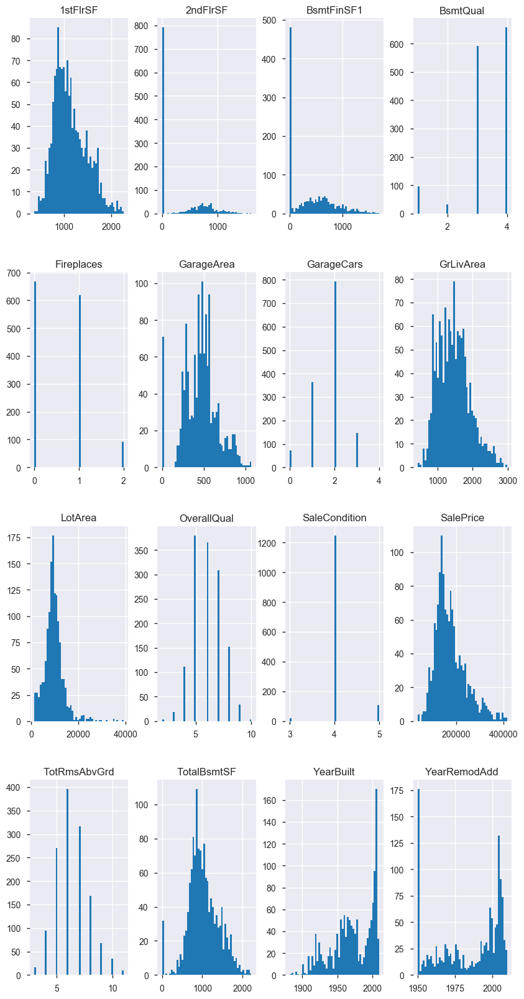

In [554]:
#lets draw histogram 
EDA_withoutoutlier[features1].hist(bins=50, figsize = (10,20))

lotarea is left skewed
Salesprice is right skewed
For right skewed we take log transform to make it as close as to a normal distribution, hence we will log transform the salesprice and will leave other attributes for now

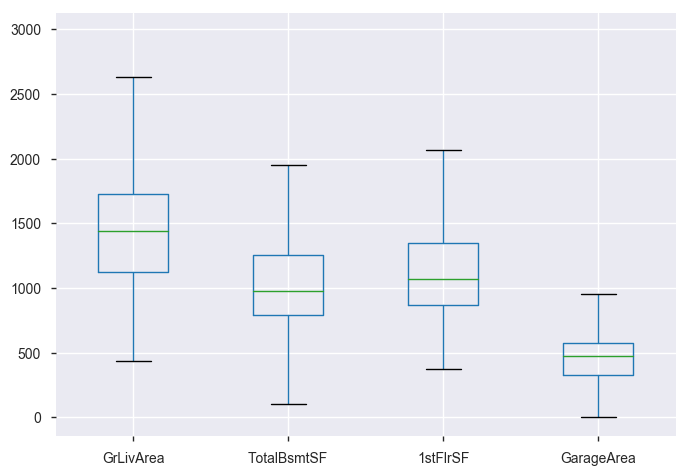

In [575]:
#Although we have removed the outliers but still lets check through box plot
EDA_withoutoutlier.boxplot(column=['GrLivArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'GarageArea'],
                 return_type='axes',
                 figsize=(40,40))

It seems there are no outliers present in selected variables

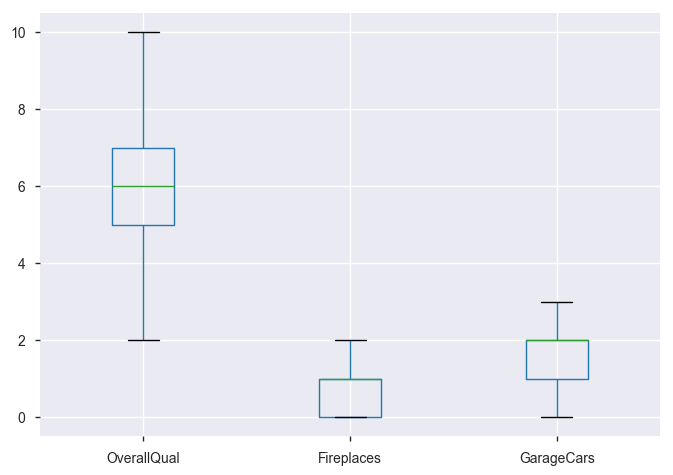

In [559]:
EDA_withoutoutlier.boxplot(column=['OverallQual', 'Fireplaces', 'GarageCars', ],
                 return_type='axes',
                 figsize=(40,40))

No outliers

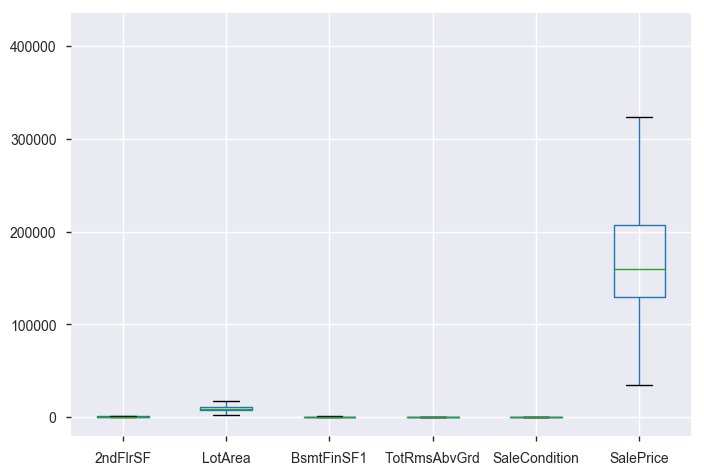

In [562]:
EDA_withoutoutlier.boxplot(column=['2ndFlrSF',
       'LotArea', 'BsmtFinSF1', 'TotRmsAbvGrd',
       'SaleCondition', 'SalePrice'],
                 return_type='axes',
                 figsize=(40,40))

No outliers

(array([0, 1, 2]), <a list of 3 Text xticklabel objects>)

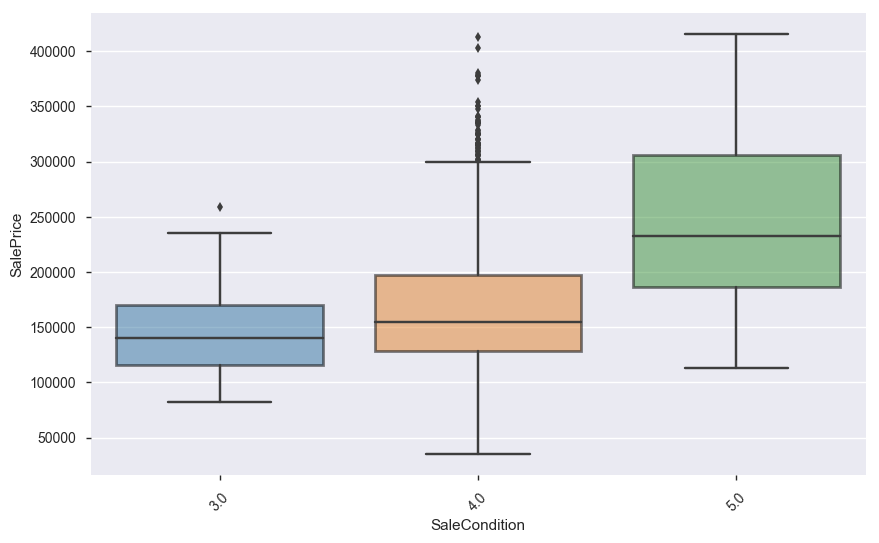

In [564]:
# we can also plot boxplots to check for categories within a category 
plt.figure(figsize = (10, 6))
ax = sns.boxplot(x='SaleCondition', y='SalePrice', data=EDA_withoutoutlier)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(rotation=45)

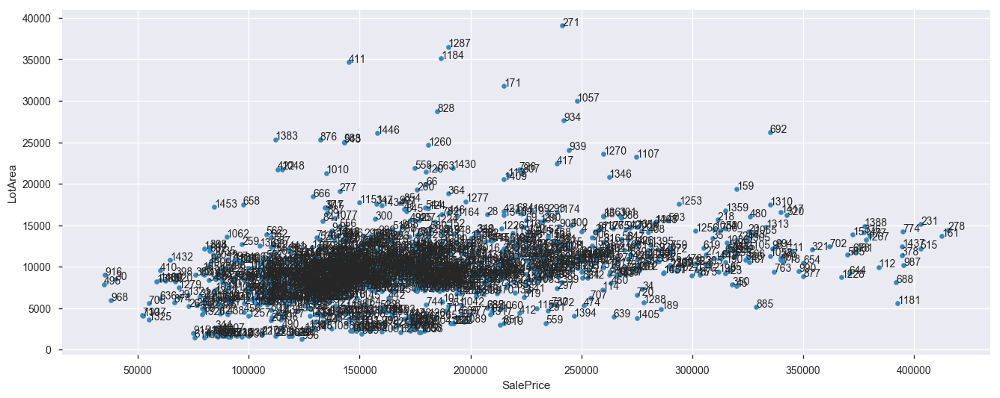

In [577]:
#Just came across this code and wanted to test on the given dataset
#source: https://www.packtpub.com/mapt/book/application_development/9781785287466/4/ch04lvl1sec69/performing-outlier-detection
# source code is changed to suit the current dataset
fig, ax = plt.subplots()

for k, v in EDA_withoutoutlier.iterrows():
    ax.annotate(k,(v['SalePrice'],v['LotArea']))

EDA_withoutoutlier.plot(kind='scatter',
              x='SalePrice',
              y='LotArea',
              figsize=(16, 6),
              ax=ax)


fig.canvas.draw()
plt.show()

In [569]:
#lets draw ECDF
def plot_ECDF(X):
    x = np.sort(EDA_withoutoutlier[X])
    y=np.arange(1,len(x)+1)/len(x)
    plt.plot(x,y,marker='.',linestyle='none')
    plt.xlabel(X)
    plt.ylabel("ECDF")
    plt.margins(0.02)
    plt.show()

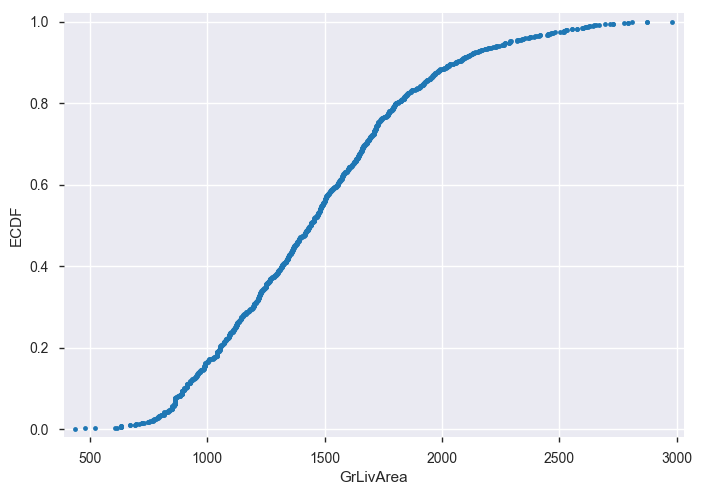

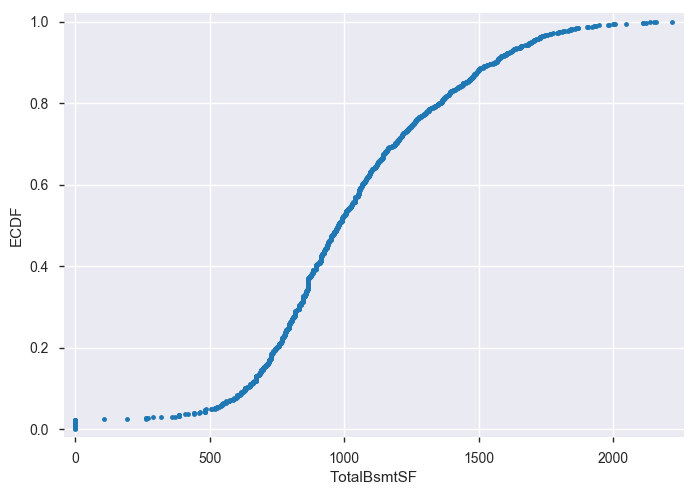

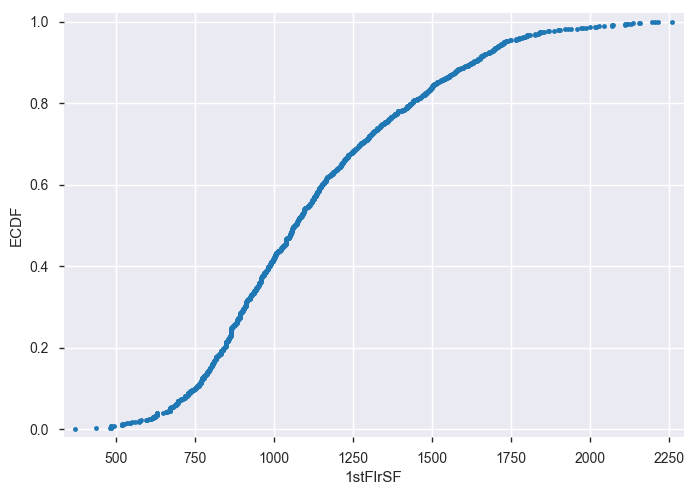

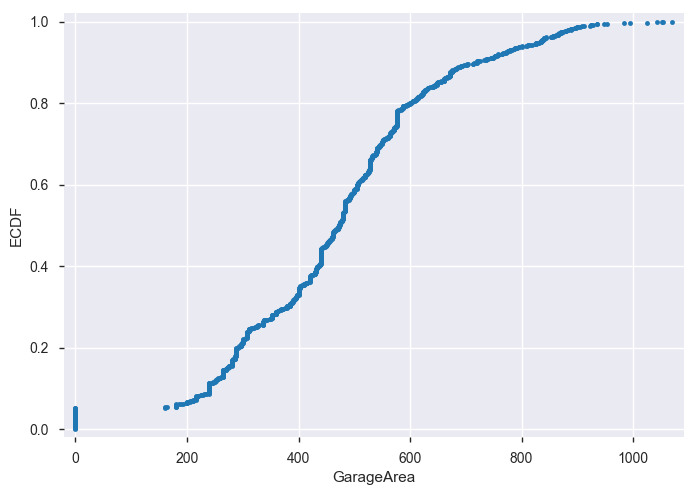

In [570]:
plot_ECDF('GrLivArea')
plot_ECDF('TotalBsmtSF')
plot_ECDF('1stFlrSF')
plot_ECDF('GarageArea')

80% of the houses are below 2000 grlivarea

90% of the houses are below 1800 TotalBsmtSF

90% of the houses are below 1750 1stFlrSF

80% of the houses are below 600 GarageArea

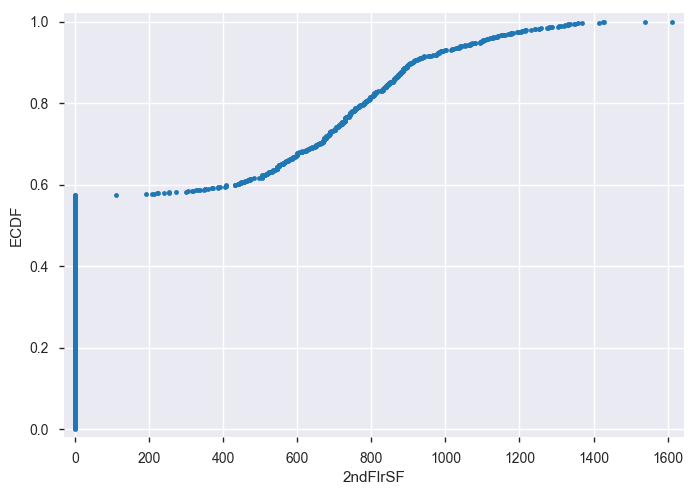

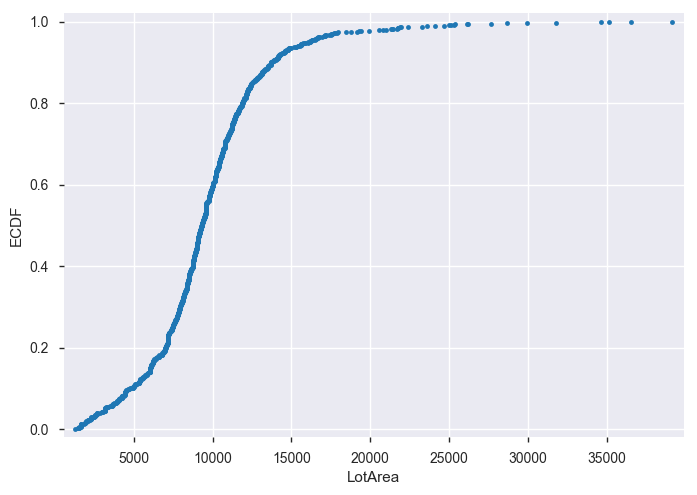

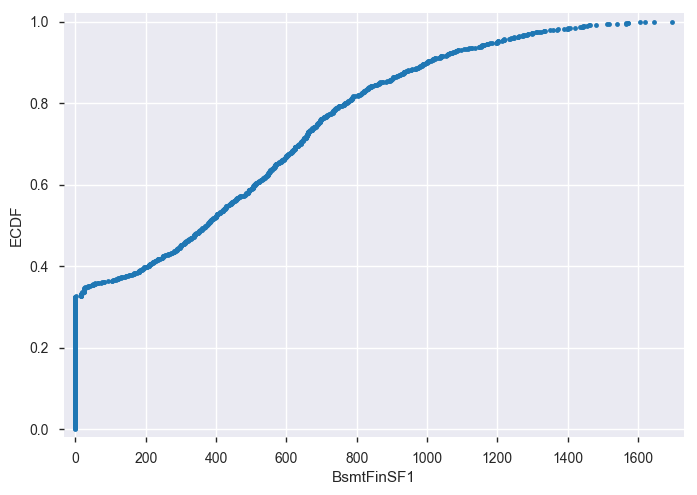

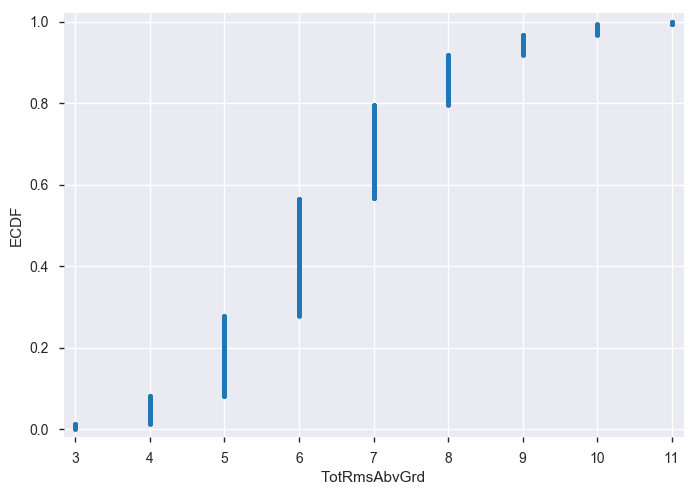

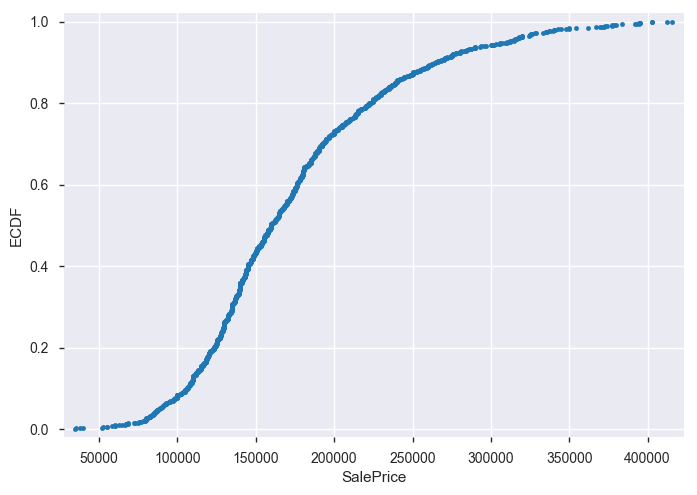

In [573]:
plot_ECDF('2ndFlrSF')
plot_ECDF('LotArea')
plot_ECDF('BsmtFinSF1')
plot_ECDF('TotRmsAbvGrd')
plot_ECDF('SalePrice')

80% of the houses have price below 225000

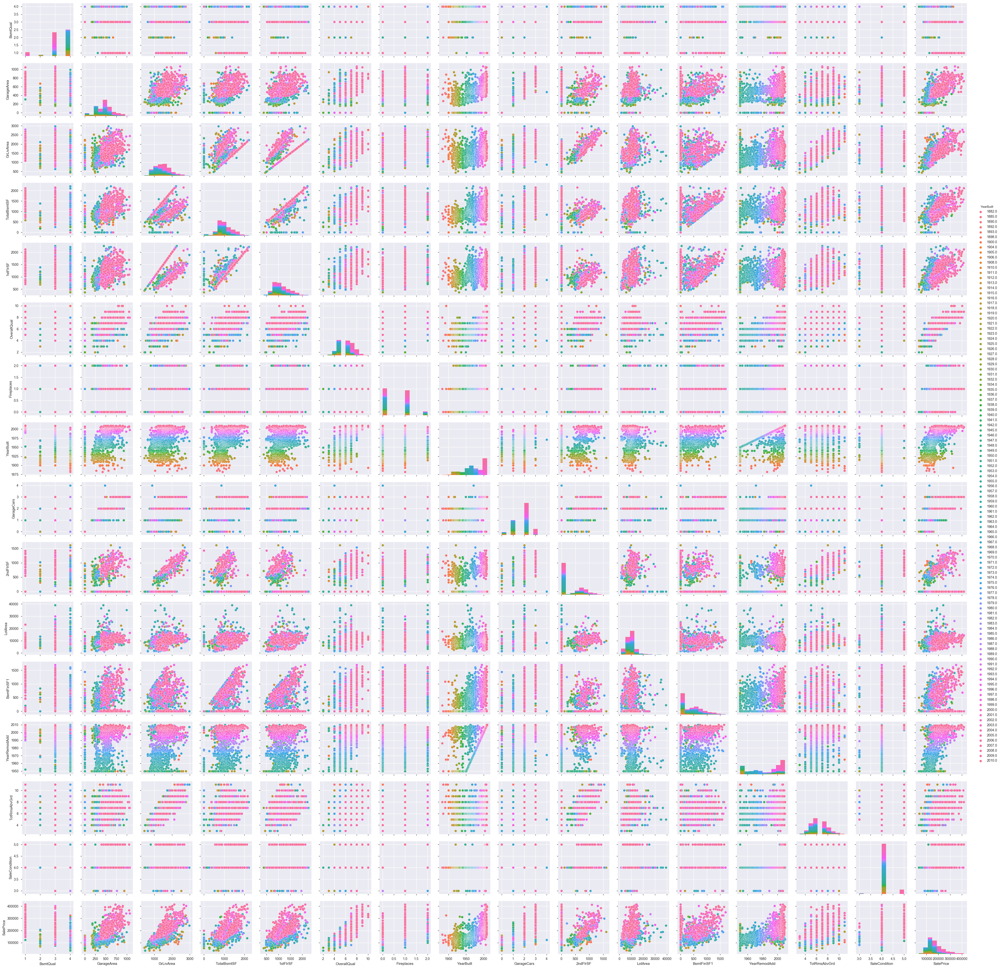

In [574]:
#lets plot scatter plot
sns.pairplot(vars=features1, data=EDA_withoutoutlier, hue = 'YearBuilt')

Salesprices seems to increase as per increase in predictors. Also, it seems most of the houses are built between 1990 to 2010

1stFlrSF, BsmtFinSF1, GarageArea are leftskewed 
Salesprice is right skewed

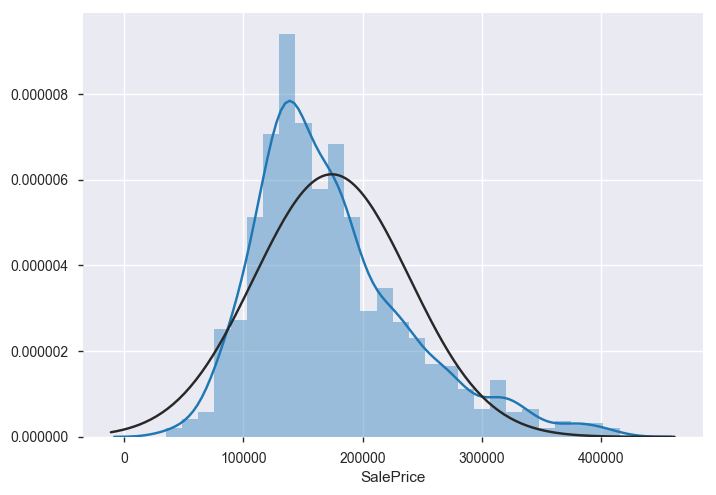

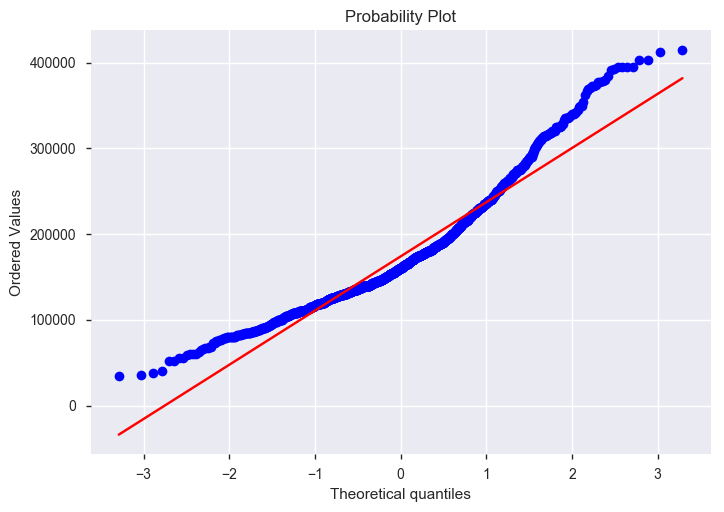

In [580]:
#lets take a log transform of saleprice,but before taking a log transform lets check how saleprice looks
sns.distplot(EDA_withoutoutlier['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(EDA_withoutoutlier['SalePrice'], plot=plt)

In [25]:
#As sales price is right skewed lets take a log transform
EDA_withoutoutlier['LogSalePrice'] = np.log(EDA_withoutoutlier['SalePrice'] )

C:\Users\nisha\AppData\Local\Enthought\Canopy\edm\envs\User\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


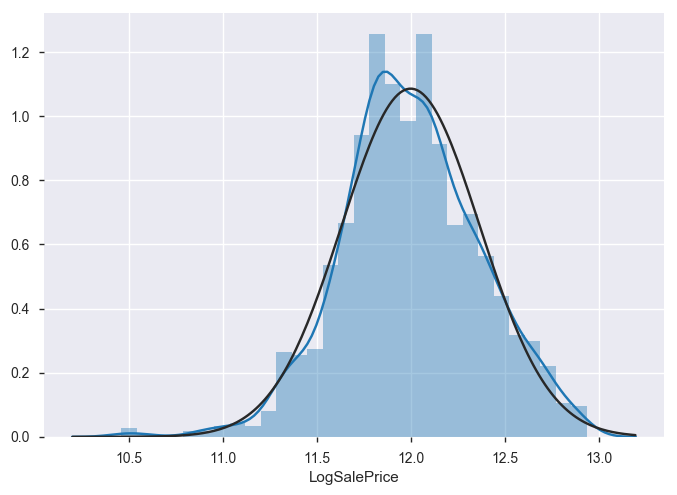

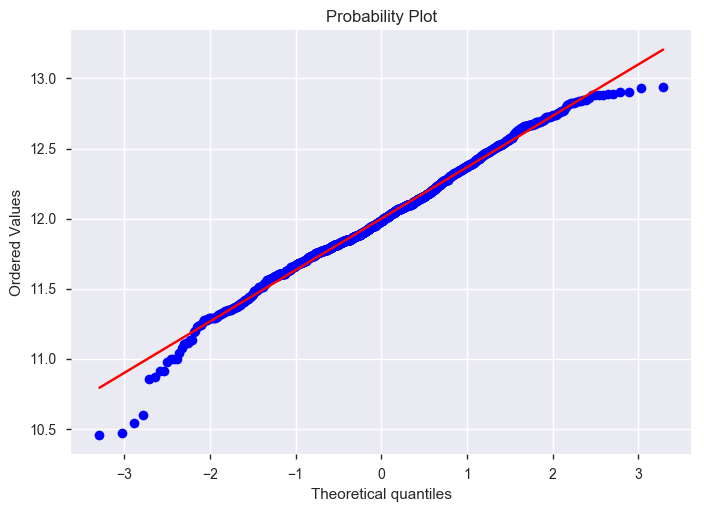

In [582]:
#lets plot
sns.distplot(EDA_withoutoutlier['LogSalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(EDA_withoutoutlier['LogSalePrice'], plot=plt)

We can see the log transform has worked. I have searched that for left skewed we need to take square but lets leave it for the time being

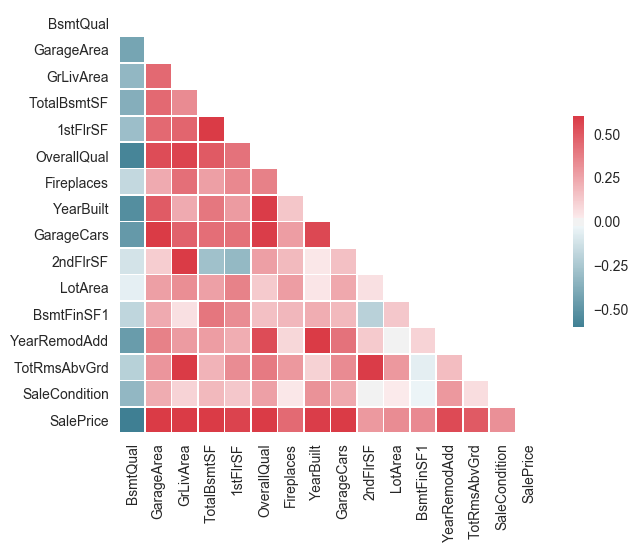

In [583]:
#lets check the correlation
sns.set(style="white")
# Compute the correlation matrix
corr = EDA_withoutoutlier[features1].corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

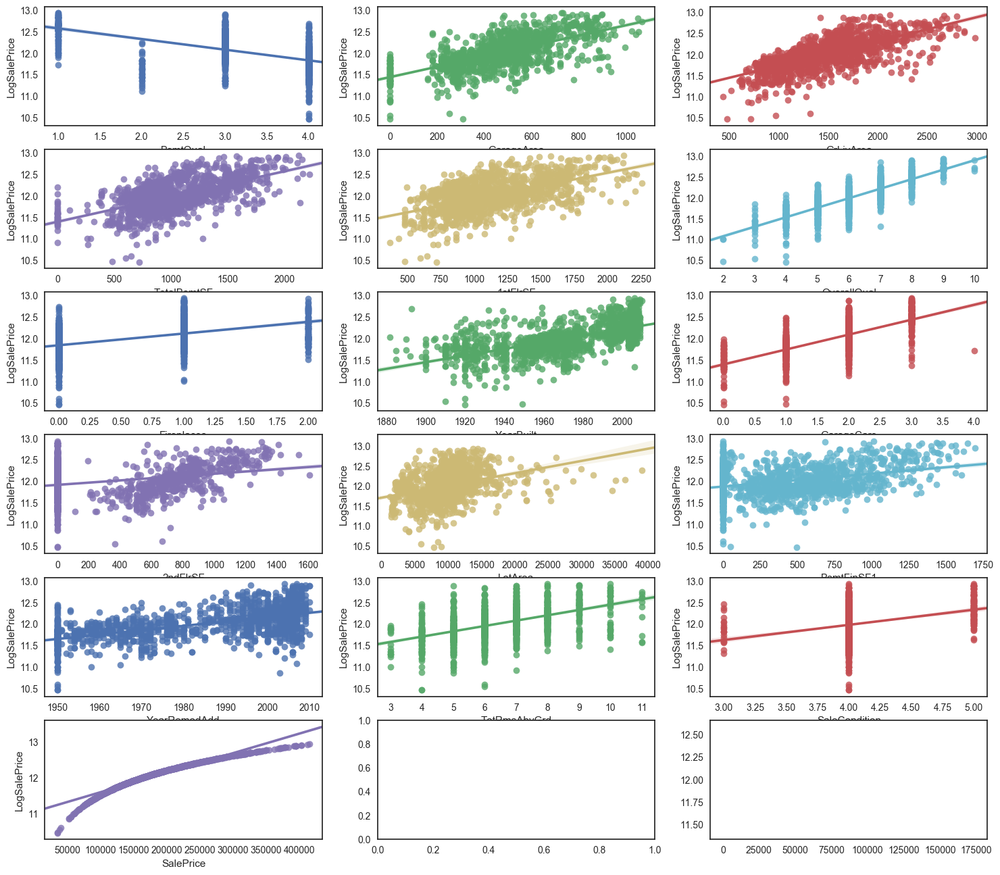

In [586]:
#lets look at the the best fit line along with the scatter plot
fig, ax = plt.subplots(round(len(EDA_withoutoutlier.columns) / 3), 3, figsize = (18, 16))

for i, ax in enumerate(fig.axes):
    if i < len(EDA_withoutoutlier.columns) - 1:
        sns.regplot(x=EDA_withoutoutlier.columns[i],y='LogSalePrice', data=EDA_withoutoutlier, ax=ax)

plt.show()

https://stackoverflow.com/questions/45525725/what-do-the-lines-in-seaborn-regplot-represent

The solid line is evidently the linear regression model fit.

The translucent band lines, however, describe a bootstrap confidence interval generated for the estimate. From the docs we can see this in the parameter info for ci:

(emphasis mine)

    ci : int in [0, 100] or None, optional

        Size of the confidence interval for the regression estimate. This will be drawn using translucent bands around the regression line. The confidence interval is estimated using a bootstrap; for large datasets, it may be advisable to avoid that computation by setting this parameter to None.

So if you don't want the overhead of performing a bootstrap to get these CI bands, just pass ci=None

In [26]:
#As we have merged the training dataset created earlier and removed the outliers we will again create training set from it and test set is already created
X_train_final = EDA_withoutoutlier.drop(['SalePrice','LogSalePrice'],axis=1)
y_train_final = EDA_withoutoutlier['LogSalePrice']
#final_test already created for test predictors

In [46]:
#lets build a linear regression model
lm = LinearRegression()
y_pred_lm = lm.fit(X_train_final,y_train_final).predict(final_test)
final_mse = mean_squared_error(np.array(logy_test).reshape(-1),y_pred_lm)
final_rmse = np.sqrt(final_mse)
print ("final_rmse is: " ,final_rmse, "and final_mse is:", final_mse)

final_rmse is:  0.39346711299 and final_mse is: 0.154816369004


In [66]:
#Lets use decision tree regressor
dtr = DecisionTreeRegressor()
y_pred_dtr = dtr.fit(X_train_final,y_train_final).predict(final_test)
"""final_mse_dtr = mean_squared_error(np.array(logy_test).reshape(-1),y_pred_dtr)
final_rmse_dtr = np.sqrt(final_mse_dtr)
print ("final_rmse is: " ,final_rmse_dtr, "and final_mse is:", final_mse_dtr)"""

'final_mse_dtr = mean_squared_error(np.array(logy_test).reshape(-1),y_pred_dtr)\nfinal_rmse_dtr = np.sqrt(final_mse_dtr)\nprint ("final_rmse is: " ,final_rmse_dtr, "and final_mse is:", final_mse_dtr)'

In [70]:
y_pred_dtr

array([ 11.04104808,  12.01370075,  12.16597955, ...,  12.13725833,
        11.44571672,  12.37158708])

In [71]:
y_train_final.head()

0    12.247694
1    12.109011
2    12.317167
3    11.849398
4    12.429216
Name: LogSalePrice, dtype: float64

In [67]:
#Lets use decision tree regressor on SalePrice and not on logsaleproce
dtr = DecisionTreeRegressor()
y_pred_dtr_Sale = dtr.fit(X_train_final,EDA_withoutoutlier['SalePrice']).predict(final_test)
"""final_mse_dtr = mean_squared_error(np.array(logy_test).reshape(-1),y_pred_dtr)
final_rmse_dtr = np.sqrt(final_mse_dtr)
print ("final_rmse is: " ,final_rmse_dtr, "and final_mse is:", final_mse_dtr)"""

'final_mse_dtr = mean_squared_error(np.array(logy_test).reshape(-1),y_pred_dtr)\nfinal_rmse_dtr = np.sqrt(final_mse_dtr)\nprint ("final_rmse is: " ,final_rmse_dtr, "and final_mse is:", final_mse_dtr)'

In [68]:
y_pred_dtr_Sale

array([ 129900.,  155000.,  194000., ...,  180500.,  118500.,  228000.])

In [69]:
EDA_withoutoutlier['SalePrice'].head()

0    208500.0
1    181500.0
2    223500.0
3    140000.0
4    250000.0
Name: SalePrice, dtype: float64

In [73]:
#lets use cross_validation as y_test is not there in test file
score_lm = cross_val_score(lm, X_train_final,y_train_final,scoring="neg_mean_squared_error", cv=10)

In [75]:
score_lm

array([-0.01967774, -0.01565137, -0.01716122, -0.01845485, -0.02547361,
       -0.01096502, -0.01770068, -0.01629704, -0.01661057, -0.01955612])

In [88]:
lm_rmse_score = np.sqrt(-score_lm)
print(lm_rmse_score)
print(np.mean(lm_rmse_score))

[ 0.14027738  0.12510542  0.13100084  0.13584862  0.15960455  0.10471402
  0.1330439   0.12765984  0.12888201  0.1398432 ]
0.132597977731


In [84]:
#using scoring parameter as r2
score_lm_ev = cross_val_score(lm, X_train_final,y_train_final,scoring="r2", cv=10)
print(score_lm_ev)
print(np.mean(score_lm_ev))

[ 0.84719302  0.88794813  0.88826445  0.86892192  0.84709197  0.88169522
  0.87701277  0.85780434  0.85067294  0.87126284]
0.867786759832


This model is performing well on dev set

In [105]:
#let check with SalePrice
score_lm_wl = cross_val_score(lm, X_train_final,EDA_withoutoutlier['SalePrice'],scoring="neg_mean_squared_error", cv=10)
lmwlwl_rmse_score = np.sqrt(-score_lm_wl)
print("Mean RMSE: ",np.mean(lmwlwl_rmse_score))
score_lm_wlr = cross_val_score(lm, X_train_final,EDA_withoutoutlier['SalePrice'],scoring="r2", cv=10)
print("Mean R2: ",np.mean(score_lm_wlr))

Mean RMSE:  23771.1319369
Mean R2:  0.864768113008


With log R2 was 0.867786759832 and without log R2 is 0.864768113008, there not much increment in R2 after taking the log. But interesing point to note is after making a submission with log of salesprice position got improved by 600 places :)

In [89]:
#rmse decision tree cheking MSE with logSalePrice
score_dtr_wl_mse = cross_val_score(dtr, X_train_final,y_train_final,scoring="neg_mean_squared_error", cv=10)
dtr_rmse_score = np.sqrt(-score_dtr_wl_mse)
print(dtr_rmse_score)
print(np.mean(dtr_rmse_score))

[ 0.20080654  0.22391751  0.17929346  0.2108451   0.18724205  0.20214927
  0.19830876  0.19373098  0.23744907  0.21068856]
0.204443127941


In [90]:
#rmse decision tree cheking MSE with SalePrice
score_dtr_mse = cross_val_score(dtr, X_train_final,EDA_withoutoutlier['SalePrice'],scoring="neg_mean_squared_error", cv=10)
dtrwl_rmse_score = np.sqrt(-score_dtr_mse)
print(dtrwl_rmse_score)
print(np.mean(dtrwl_rmse_score))

[ 33563.62829545  34533.28505487  32334.37906067  34357.69288263
  34348.52799358  33372.84063394  30946.4083058   31326.3697343
  34430.90819498  34681.60069646]
33389.5640853


In [87]:
#decision tree cheking r2 with logSalePrice
score_dtr_wl = cross_val_score(dtr, X_train_final,y_train_final,scoring="r2", cv=10)
print(score_dtr_wl)
print(np.mean(score_dtr_wl))

[ 0.66460002  0.62195981  0.78038176  0.6805267   0.7773871   0.56991894
  0.72640214  0.6784661   0.52205891  0.70239179]
0.672409327225


In [86]:
#decision tree cheking r2 with SalePrice
score_dtr = cross_val_score(dtr, X_train_final,EDA_withoutoutlier['SalePrice'],scoring="r2", cv=10)
print(score_dtr)
print(np.mean(score_dtr))

[ 0.71054788  0.69981166  0.77555869  0.76986031  0.76795529  0.64648191
  0.74118778  0.69841458  0.68711357  0.72079108]
0.721772274725


As we can see decision tree works better with the Saleprice as target than LogSalePrice

In [117]:
#Using RandomForestRegressor
rf = RandomForestRegressor()
score_rf = cross_val_score(rf,X_train_final,y_train_final,scoring="r2", cv=10)
print (np.mean(score_rf))

0.840284455725


In [118]:
rf = RandomForestRegressor()
score_rf = cross_val_score(rf,X_train_final,EDA_withoutoutlier['SalePrice'],scoring="r2", cv=10)
print (np.mean(score_rf))

0.857219215284


interesting not only randomforest performing better than decision tree but also works better with saleprice

In [126]:
sgd  =SGDRegressor(penalty="l2")
score_sgd = cross_val_score(sgd,X_train_final,y_train_final,scoring="r2", cv=10)
print(np.mean(score_sgd))

-4.64470409911e+34


In [124]:
#using polynomial regression
poly_features = PolynomialFeatures(degree=2, include_bias=False)
x_poly = poly_features.fit_transform(X_train_final)
score_pf = cross_val_score(lm,x_poly,y_train_final,scoring="r2",cv=10)
print(np.mean(score_pf))

0.854032438512


In [129]:
#using ridge
rf = Ridge(alpha=1,solver="cholesky")
score_rid = cross_val_score(rf, X_train_final,y_train_final,scoring="r2",cv=10)
print (np.mean(score_rid))

0.867791519238


Performing better than linear regression

In [131]:
#using lasso
lf = Lasso(alpha=1)
score_las= cross_val_score(lf, X_train_final,y_train_final,scoring="r2",cv=10)
print (np.mean(score_las))

0.799374030102


In [134]:
#using elastic net
elas = ElasticNet(alpha=0.1,l1_ratio=0.5)
score_elas = cross_val_score(elas,X_train_final,y_train_final,scoring="r2",cv=10)
print(np.mean(score_elas))

0.831134653649


In [28]:
#using XGBoostRegressor
xg =XGBRegressor(max_depth=5)
sol_xg =cross_val_score(xg,X_train_final,y_train_final,scoring="r2",cv=10)
print(np.mean(sol_xg))

0.863465742415


In [30]:
#using XGBoostRegressor without log
xg =XGBRegressor(max_depth=5)
sol_xg =cross_val_score(xg,X_train_final,EDA_withoutoutlier['SalePrice'],scoring="r2",cv=10)
print(np.mean(sol_xg))

0.883367926514


In [32]:
y_pred_xg = xg.fit(X_train_final,y_train_final).predict(final_test[features])
y_pred_xg = pd.DataFrame(y_pred_xg,columns=['SalePrice'])
sub3 = pd.concat([final_test['Id'],y_pred_xg],axis=1)
sub3.to_csv('D:/Kaggle/Houseprediction/xg1.csv')
